In [4]:
import torch
import sys
import scanpy as sc
import os
import matplotlib.pyplot as plt
import importlib

sys.path.append(os.path.abspath(".."))

idxs = [1, 2, 3, 4]


In [5]:
import random
import numpy as np

def seed_everything(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    os.environ['PYTHONHASHSEED'] = str(seed)
    return

seed_everything(42)

ERROR! Session/line number was not unique in database. History logging moved to new session 5388


In [6]:

timepoints_across_datasets = []
replicates_across_datasets = []

for i in idxs:
    
    filehandle_ME = f'/scratch/gpfs/ph3641/hm_ot/adata_JAX_dataset_{i}.h5ad'
    
    sys.path.insert(0, filehandle_ME)
    adata = sc.read_h5ad(filehandle_ME, backed="r")
    
    # Extract unique timepoints
    timepoints = list( adata.obs['day'].unique() )
    
    if 'P0' in timepoints:
        # Not one of the E_XYZ formatted stages, so removing
        timepoints.remove('P0')
    
    # Sort timepoints by the numeric value after removing the "E" prefix
    timepoints = sorted(timepoints, key=lambda tp: float(tp.replace("E", "")))
    
    # Extract unique replicates
    replicates = adata.obs['embryo_id'].unique()  # Biological replicates
    batches = adata.obs['experimental_batch'].unique()  # Technical batches
    
    replicates = []
    
    for tp in timepoints:
        replicates.append( adata[adata.obs['day'] == tp].obs['embryo_id'].unique()[0] )

    # Display results
    print("Timepoints:", timepoints)
    print("Biological Replicates (Embryo IDs):", replicates)
    print("Technical Batches:", batches)
    
    timepoints_across_datasets.append(timepoints)
    replicates_across_datasets.append(replicates)
    
    del adata

Timepoints: ['E8.5', 'E8.75', 'E9.0', 'E9.25', 'E9.5', 'E9.75', 'E10.0', 'E10.25', 'E10.5', 'E10.75']
Biological Replicates (Embryo IDs): ['embryo_11', 'embryo_14', 'embryo_16', 'embryo_20', 'embryo_24', 'embryo_28', 'embryo_30', 'embryo_33', 'embryo_34', 'embryo_35']
Technical Batches: ['run_4', 'run_15', 'run_17', 'run_19']
Categories (4, object): ['run_4', 'run_15', 'run_17', 'run_19']
Timepoints: ['E11.0', 'E11.25', 'E11.5', 'E11.75', 'E12.0', 'E12.25', 'E12.5', 'E12.75', 'E13.0', 'E13.25', 'E13.5', 'E13.75']
Biological Replicates (Embryo IDs): ['embryo_36', 'embryo_37', 'embryo_38', 'embryo_39', 'embryo_40', 'embryo_41', 'embryo_42', 'embryo_43', 'embryo_45', 'embryo_47', 'embryo_49', 'embryo_52']
Technical Batches: ['run_16', 'run_14', 'run_19', 'run_13']
Categories (4, object): ['run_13', 'run_14', 'run_16', 'run_19']
Timepoints: ['E14.0', 'E14.25', 'E14.333', 'E14.75', 'E15.0', 'E15.25', 'E15.5', 'E15.75', 'E16.0', 'E16.25', 'E16.5', 'E16.75']
Biological Replicates (Embryo IDs)

In [7]:
import pandas as pd
import src.utils.clustering as clustering
import src.plotting as plotting
import pickle
import numpy as np


# Filehandle for final differentiation map outputs
diffmap_dir = "/scratch/gpfs/ph3641/hm_ot/ME_supervised_diffmap_allrep/"
diffmap_dir_moscot = "/scratch/gpfs/ph3641/hm_ot/ME_supervised_diffmap_moscot_allrep/"

os.makedirs(diffmap_dir, exist_ok=True)
# os.makedirs(diffmap_dir_moscot, exist_ok=True)

# Cell-type labels for all timepoints + replicates
df_cell = pd.read_csv("/scratch/gpfs/ph3641/hm_ot/df_cell.csv")
df_cell = df_cell.set_index("cell_id")


In [8]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [9]:
'''
import src.HiddenMarkovOT as HiddenMarkovOT
import src.utils.util_LR as util_LR
from src.utils.util_LR import convert_adata
import copy

timepoints = ['E8.5', 'E8.75', 'E9.0', 'E9.25', 'E9.5'] #['E9.0', 'E9.25', 'E9.5'] #['E8.5', 'E8.75', 'E9.0', 'E9.25', 'E9.5']

filehandle_ME = f'/scratch/gpfs/ph3641/hm_ot/adata_JAX_dataset_1.h5ad'
sys.path.insert(0, filehandle_ME)
adata = sc.read_h5ad(filehandle_ME, backed="r")

for i in range(0, len(timepoints)-1):
    t1, t2 = timepoints[i], timepoints[i+1]
    subset_adata = adata[
            (adata.obs['day'].isin([t1, t2]))
    ]
    subset_adata = subset_adata.to_memory()
    subset_adata.obs = subset_adata.obs.set_index("cell_id")
    subset_adata.obs = subset_adata.obs.join(df_cell[['celltype_update']], how="left")
    print('-----Starting PCA!-----')
    sc.pp.normalize_total(subset_adata, target_sum=1e4)
    sc.pp.log1p(subset_adata)
    sc.pp.pca(subset_adata, n_comps=30)
    print('-----PCA done!-----')
    rank1 = subset_adata[subset_adata.obs['day'] == t1].obs['celltype_update'].nunique()
    rank2 = subset_adata[subset_adata.obs['day'] == t2].obs['celltype_update'].nunique()
    r_max = 150
    print(f'{rank1} to {rank2} cell-types')
    print(subset_adata)
    
    C_factors_sequence, A_factors_sequence, Qs, labels, rank_list, _spatial_list = convert_adata(subset_adata,
                                                                                                 timepoints=[t1, t2],
                                                                                                 timepoint_key = 'day',
                                                                                                 replicate_key = 'embryo_id',
                                                                                                 feature_key = 'X_pca',
                                                                                                cell_type_key = 'celltype_update',
                                                                                                spatial = False,
                                                                                                dist_eps = 0.02,
                                                                                                dist_rank = r_max,
                                                                                                device = device)
    hmot_sup = HiddenMarkovOT.HM_OT(
                                rank_list, 
                                tau_in = 1e-3,
                                tau_out = 1e-3,
                                gamma= 7,
                                max_iter= 20,
                                min_iter= 20,
                                device=device,
                                dtype=torch.float32,
                                 printCost=False,
                                returnFull=False,
                                alpha=0.0,
                                initialization='Full'
                               )
    
    hmot_sup.impute_annotated_transitions(C_factors_sequence, 
                                     A_factors_sequence, 
                                     copy.deepcopy(Qs))
    T_hmot = hmot_sup.T_gammas[0].cpu().numpy()
    Qs_ann = [Q.cpu().numpy() for Q in Qs]
    
    np.save(os.path.join(diffmap_dir, t1 + "_Q.npy"), Qs_ann[0])
    np.save(os.path.join(diffmap_dir, t2 + "_Q.npy"), Qs_ann[1])
    np.save(os.path.join(diffmap_dir, t1 + "_" + t2 + "_T.npy"), T_hmot )

    # Save the cell-type labels for each timepoint using write binary mode
    with open(os.path.join(diffmap_dir, t1 + '_types.pkl'), 'wb') as f:
        pickle.dump(labels[0], f)
    
    with open(os.path.join(diffmap_dir, t2 + '_types.pkl'), 'wb') as f:
        pickle.dump(labels[1], f)
'''

'\nimport src.HiddenMarkovOT as HiddenMarkovOT\nimport src.utils.util_LR as util_LR\nfrom src.utils.util_LR import convert_adata\nimport copy\n\ntimepoints = [\'E8.5\', \'E8.75\', \'E9.0\', \'E9.25\', \'E9.5\'] #[\'E9.0\', \'E9.25\', \'E9.5\'] #[\'E8.5\', \'E8.75\', \'E9.0\', \'E9.25\', \'E9.5\']\n\nfilehandle_ME = f\'/scratch/gpfs/ph3641/hm_ot/adata_JAX_dataset_1.h5ad\'\nsys.path.insert(0, filehandle_ME)\nadata = sc.read_h5ad(filehandle_ME, backed="r")\n\nfor i in range(0, len(timepoints)-1):\n    t1, t2 = timepoints[i], timepoints[i+1]\n    subset_adata = adata[\n            (adata.obs[\'day\'].isin([t1, t2]))\n    ]\n    subset_adata = subset_adata.to_memory()\n    subset_adata.obs = subset_adata.obs.set_index("cell_id")\n    subset_adata.obs = subset_adata.obs.join(df_cell[[\'celltype_update\']], how="left")\n    print(\'-----Starting PCA!-----\')\n    sc.pp.normalize_total(subset_adata, target_sum=1e4)\n    sc.pp.log1p(subset_adata)\n    sc.pp.pca(subset_adata, n_comps=30)\n    pr

loading E8.5 to E8.75
loading E8.75 to E9.0
loading E9.0 to E9.25
loading E9.25 to E9.5


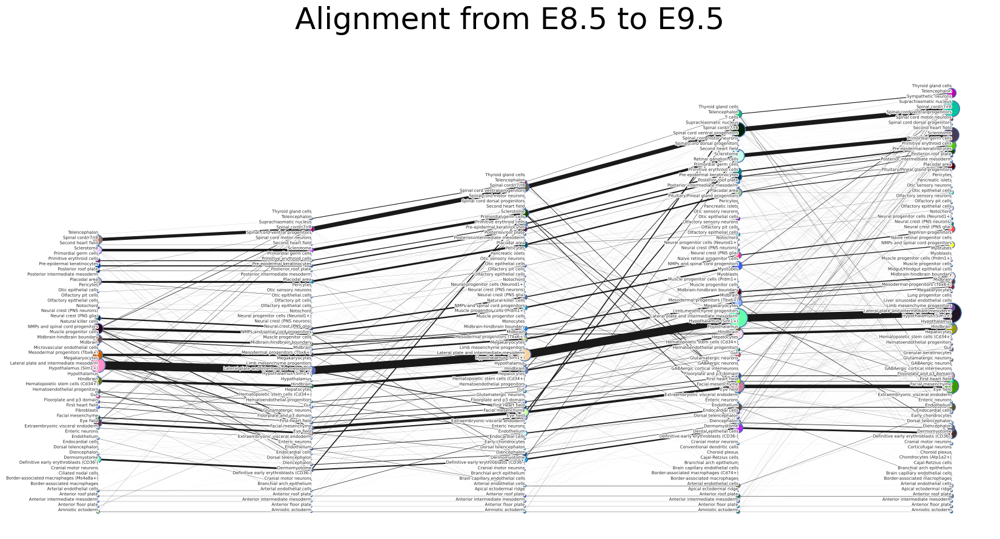

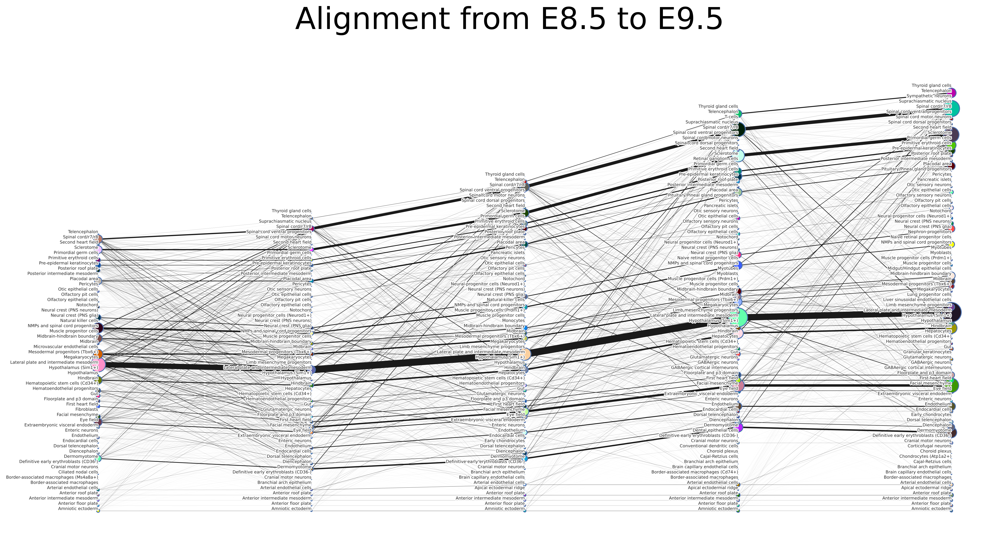

In [10]:
import os
import numpy as np
import pickle
import importlib
importlib.reload(plotting)


timepoints = ['E8.5', 'E8.75', 'E9.0', 'E9.25', 'E9.5']

_Qs = []
_Ts = []
_Ts_m = []
_labels = []

for i in range(len(timepoints) - 1):
    
    t1 = timepoints[i]
    t2 = timepoints[i + 1]

    print(f'loading {t1} to {t2}')
    
    # Load Q and T matrices
    Q1 = np.load(os.path.join(diffmap_dir, f"{t1}_Q.npy"))
    Q2 = np.load(os.path.join(diffmap_dir, f"{t2}_Q.npy"))
    
    T12 = np.load(os.path.join(diffmap_dir, f"{t1}_{t2}_T.npy"))
    T12_m = np.load(os.path.join(diffmap_dir_moscot, f"{t1}_{t2}_T.npy"))
    
    if i == 0:
        _Qs.append(Q1)
        
    _Qs.append(Q2)
    _Ts.append(T12)
    _Ts_m.append(T12_m)
    
    # Load labels
    with open(os.path.join(diffmap_dir, f"{t1}_types.pkl"), 'rb') as f:
        Label_t1 = pickle.load(f)
    with open(os.path.join(diffmap_dir, f"{t2}_types.pkl"), 'rb') as f:
        Label_t2 = pickle.load(f)
    
    if i == 0:
        _labels.append(Label_t1)
    _labels.append(Label_t2)

# Plot the full alignment
plotting.diffmap_from_QT(
    _Qs, _Ts, _labels,
    dsf=0.01,
    fontsize=5,
    linethick_factor=55,
    title=f"Alignment from {timepoints[0]} to {timepoints[-1]}",
    save_name=os.path.join("/scratch/gpfs/ph3641/hm_ot/ME_supervised_figs/all.png")
)

plotting.diffmap_from_QT(
    _Qs, _Ts_m, _labels,
    dsf=0.01,
    fontsize=5,
    linethick_factor=55,
    title=f"Alignment from {timepoints[0]} to {timepoints[-1]}",
    save_name=os.path.join("/scratch/gpfs/ph3641/hm_ot/ME_supervised_figs/all_moscot.png")
)

In [11]:
import differentiation_map_validation as dmv
importlib.reload(dmv)

edge_dir = "/scratch/gpfs/ph3641/hm_ot/edges.txt"
node_dir = "/scratch/gpfs/ph3641/hm_ot/nodes.txt"
# Load the data
nodes_df = pd.read_csv(node_dir, sep="\t")
edges_df = pd.read_csv(edge_dir, sep="\t")

G, labels_G = dmv.yield_differentiation_graph(
    nodes_df, edges_df,
    plotting=False,
    include_downstream=True
)


In [12]:
from collections import defaultdict

# All compositions of the differentiation map between s, t \in [N]
composed_T = {}
for i in range(len(timepoints)-1):
    T_acc = _Ts[i].copy()
    for j in range(i+1, len(timepoints)-1):
        T_j = _Ts[j]
        g_j = np.sum(T_j, axis = 1)
        T_acc = T_acc.dot(
                        np.diag( 1 / g_j) @ T_j
                         )
        composed_T[(i, j+1)] = T_acc

all_edge_scores = defaultdict(list)
all_diag_scores = defaultdict(list)

for (i, j), T_ij in composed_T.items():
    Q_pair     = [_Qs[i],     _Qs[j]]
    labels_pair= [_labels[i], _labels[j]]
    tp_pair    = [timepoints[i], timepoints[j]]
    
    # score all published edges (off-diagonal) and self-transitions
    edge_scores, diag_scores = dmv.score_from_graph(
        Q_pair, [T_ij], labels_pair, tp_pair,
        G, labels_G, edges_df,
        diagonal_from_G=False
    )
    # collect into our global dicts
    for k,v in edge_scores.items():
        all_edge_scores[k].extend(v)
    for k,v in diag_scores.items():
        all_diag_scores[k].extend(v)

mean_off = np.mean([max(v) for v in all_edge_scores.values()])
mean_diag= np.mean([np.mean(v) for v in all_diag_scores.values()])
print(f"Mean downstream NPMI: {mean_off:.3f}, mean diagonal NPMI: {mean_diag:.3f}")


# All compositions of the differentiation map between s, t \in [N]
composed_T_m = {}
for i in range(len(timepoints)-1):
    T_acc = _Ts_m[i].copy()
    for j in range(i+1, len(timepoints)-1):
        T_j = _Ts_m[j]
        g_j = np.sum(T_j, axis = 1)
        T_acc = T_acc.dot(
                        np.diag( 1 / g_j) @ T_j
                         )
        composed_T_m[(i, j+1)] = T_acc

all_edge_scores_m = defaultdict(list)
all_diag_scores_m = defaultdict(list)

for (i, j), T_ij in composed_T_m.items():
    Q_pair     = [_Qs[i],     _Qs[j]]
    labels_pair= [_labels[i], _labels[j]]
    tp_pair    = [timepoints[i], timepoints[j]]
    
    # score all published edges (off-diagonal) and self-transitions
    edge_scores, diag_scores = dmv.score_from_graph(
        Q_pair, [T_ij], labels_pair, tp_pair,
        G, labels_G, edges_df,
        diagonal_from_G=False
    )
    # collect into our global dicts
    for k,v in edge_scores.items():
        all_edge_scores_m[k].extend(v)
    for k,v in diag_scores.items():
        all_diag_scores_m[k].extend(v)

mean_off = np.mean([max(v) for v in all_edge_scores_m.values()])
mean_diag= np.mean([np.mean(v) for v in all_diag_scores_m.values()])
print(f"Mean downstream NPMI: {mean_off:.3f}, mean diagonal NPMI: {mean_diag:.3f}")




Mean downstream NPMI: 0.230, mean diagonal NPMI: 0.393
Mean downstream NPMI: 0.208, mean diagonal NPMI: 0.330


/tmp/ipykernel_1135593/3761858127.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


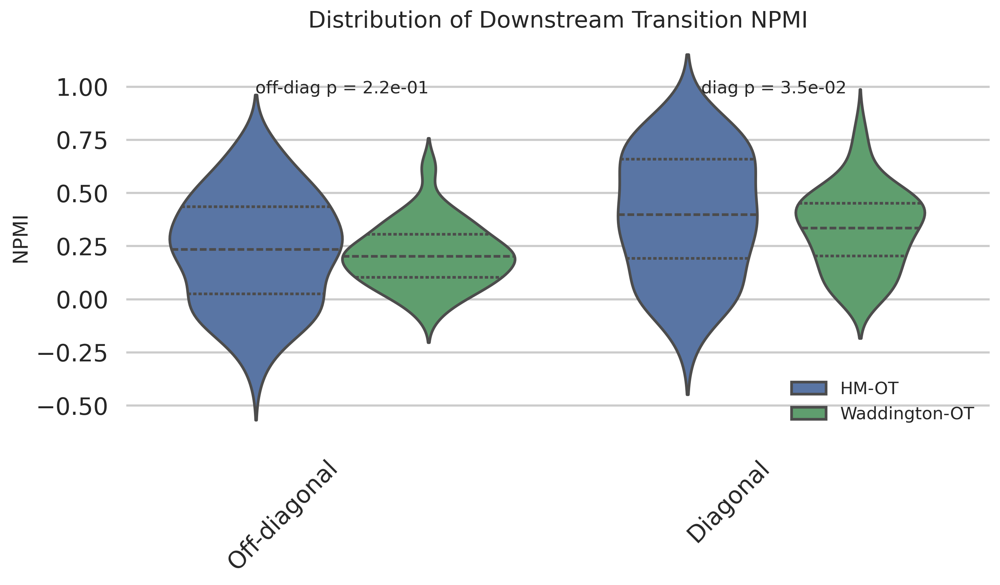

In [13]:

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import wilcoxon

def plot_downstream_npmi_violin(all_edge_scores, all_edge_scores_m,
                                all_diag_scores, all_diag_scores_m):
    """
    all_edge_scores, all_edge_scores_m: dict edge→list of off-diagonal NPMI values
    all_diag_scores, all_diag_scores_m: dict node→list of diagonal NPMI values
    """
    # Prepare lists
    npmis = [max(v) for v in all_edge_scores.values()]
    npmis_m = [max(v) for v in all_edge_scores_m.values()]
    diagonal_npmis = [np.mean(v) for v in all_diag_scores.values()]
    diagonal_npmis_m = [np.mean(v) for v in all_diag_scores_m.values()]
    
    # Build DataFrame
    df_off = pd.DataFrame({
        'NPMI': npmis + npmis_m,
        'Method': ['HM-OT'] * len(npmis) + ['Waddington-OT'] * len(npmis_m),
        'Transition': ['Off-diagonal'] * (len(npmis) + len(npmis_m))
    })
    df_diag = pd.DataFrame({
        'NPMI': diagonal_npmis + diagonal_npmis_m,
        'Method': ['HM-OT'] * len(diagonal_npmis) + ['Waddington-OT'] * len(diagonal_npmis_m),
        'Transition': ['Diagonal'] * (len(diagonal_npmis) + len(diagonal_npmis_m))
    })
    df_all = pd.concat([df_off, df_diag], ignore_index=True)

    # Wilcoxon tests
    stat_off, p_off = wilcoxon(npmis, npmis_m)
    stat_diag, p_diag = wilcoxon(diagonal_npmis, diagonal_npmis_m)

    # Plot
    sns.set_context("talk")
    sns.set_style("whitegrid")
    palette = {"HM-OT": "#4C72B0", "Waddington-OT": "#55A868"}

    plt.figure(figsize=(10, 6))
    ax = sns.violinplot(
        data=df_all,
        x='Transition',
        y='NPMI',
        hue='Method',
        palette=palette,
        inner='quartile',
        split=False
    )
    # Rotate labels
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    # Annotate p-values
    y_max = df_all['NPMI'].max()
    ax.text(0, y_max + 0.05, f"off-diag p = {p_off:.1e}", ha='center', va='bottom', fontsize=12)
    ax.text(1, y_max + 0.05, f"diag p = {p_diag:.1e}", ha='center', va='bottom', fontsize=12)

    ax.set_ylabel("NPMI", fontsize=14)
    ax.set_xlabel("")
    ax.set_title("Distribution of Downstream Transition NPMI", fontsize=16)
    sns.despine(left=True, bottom=True)
    ax.legend(title="", frameon=False, fontsize=12)
    plt.tight_layout()
    plt.show()

plot_downstream_npmi_violin(
    all_edge_scores, all_edge_scores_m,
    all_diag_scores, all_diag_scores_m
)
